# ******SberBank Russian Housing Market***********

In [1]:
#importing packages
import pandas as pd # data preprocessing
import numpy as np # linear algebra
import matplotlib.pyplot as plt #Basic plots visualisations
%matplotlib inline
import seaborn as sns #for prettier plots
import os
import pickle
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
plt.figure(figsize=(8,6))

pd.set_option('display.max_columns' , 300)
pd.set_option('display.max_rows' , 300)

<Figure size 576x432 with 0 Axes>

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor , AdaBoostRegressor , GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error,mean_squared_error 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from xgboost.sklearn import XGBRegressor

In [3]:
import os
os.getcwd()

'C:\\Users\\Hp\\Desktop\\Projects\\task\\russian housing market'

In [4]:
train_data=pd.read_csv("train_data.csv")

In [5]:
train_data.shape

(30471, 292)

In [6]:
def summary(train_data):
    print('Shape of data :' ,train_data.shape )
    return(pd.DataFrame({"Datatype":train_data.dtypes ,
                          "NAs":train_data.isnull().sum() , 
                           "Uniques":train_data.nunique(),
                           "levels": [train_data[x].unique() for x in train_data.columns]}))

In [7]:
summary(train_data)

Shape of data : (30471, 292)


,Datatype,NAs,Uniques,levels
id,int64,0,30471,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
timestamp,object,0,1161,"[2011-08-20, 2011-08-23, 2011-08-27, 2011-09-0..."
full_sq,int64,0,211,"[43, 34, 89, 77, 67, 25, 44, 42, 36, 38, 31, 5..."
life_sq,float64,6383,175,"[27.0, 19.0, 29.0, 50.0, 77.0, 46.0, 14.0, 44...."
floor,float64,167,41,"[4.0, 3.0, 2.0, 9.0, 14.0, 10.0, 5.0, 12.0, 11..."
max_floor,float64,9572,49,"[nan, 17.0, 5.0, 22.0, 16.0, 9.0, 8.0, 0.0, 24..."
material,float64,9572,6,"[nan, 1.0, 2.0, 4.0, 6.0, 5.0, 3.0]"
build_year,float64,13605,119,"[nan, 1907.0, 1980.0, 2014.0, 1970.0, 1982.0, ..."
num_room,float64,9572,13,"[nan, 2.0, 1.0, 3.0, 4.0, 5.0, 6.0, 0.0, 19.0,..."
kitch_sq,float64,9572,74,"[nan, 11.0, 12.0, 0.0, 8.0, 1.0, 6.0, 10.0, 9...."


# Data Pre-Processing

## * In data Pre-Processing we will not change the data just see what the data is all about,
### *how many Numerical, Categorical Variables are Present 
### * Percentage of Missing values and plotting the median values for NA values and given records of that column
### * Plotting the numerical and Categorical columns w.r.t Target Variable

## 1. Seeing the Percentage Of Missing Values

In [8]:
features_with_na=[features for features in train_data.columns if train_data[features].isnull().sum()>1]

for feature in features_with_na:
    print(feature, np.round(train_data[feature].isnull().mean(), 4),  ' % missing values')

life_sq 0.2095  % missing values
floor 0.0055  % missing values
max_floor 0.3141  % missing values
material 0.3141  % missing values
build_year 0.4465  % missing values
num_room 0.3141  % missing values
kitch_sq 0.3141  % missing values
state 0.445  % missing values
preschool_quota 0.2195  % missing values
school_quota 0.2194  % missing values
hospital_beds_raion 0.4739  % missing values
raion_build_count_with_material_info 0.1638  % missing values
build_count_block 0.1638  % missing values
build_count_wood 0.1638  % missing values
build_count_frame 0.1638  % missing values
build_count_brick 0.1638  % missing values
build_count_monolith 0.1638  % missing values
build_count_panel 0.1638  % missing values
build_count_foam 0.1638  % missing values
build_count_slag 0.1638  % missing values
build_count_mix 0.1638  % missing values
raion_build_count_with_builddate_info 0.1638  % missing values
build_count_before_1920 0.1638  % missing values
build_count_1921-1945 0.1638  % missing values
bui

## 2. Plotting w.r.t Columns Having  NA Values VS Present Records

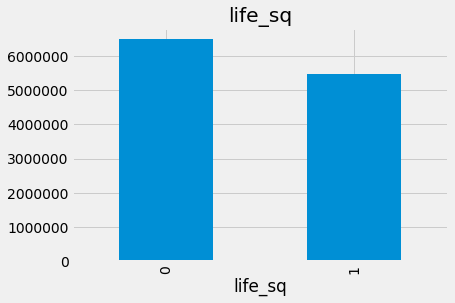

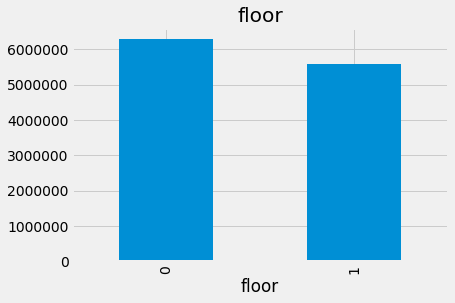

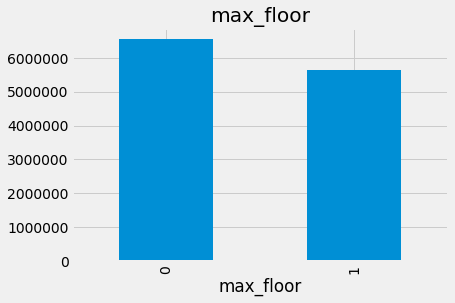

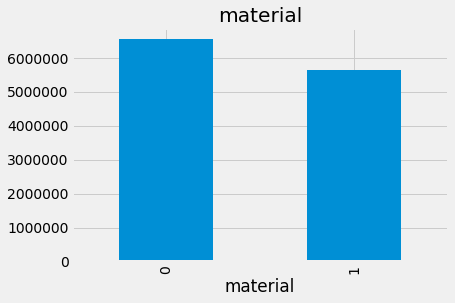

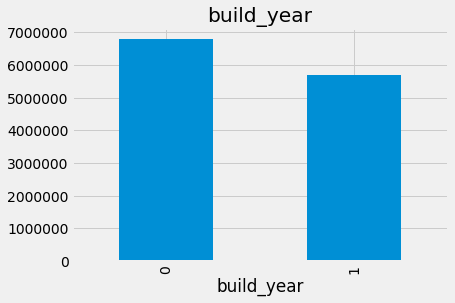

...

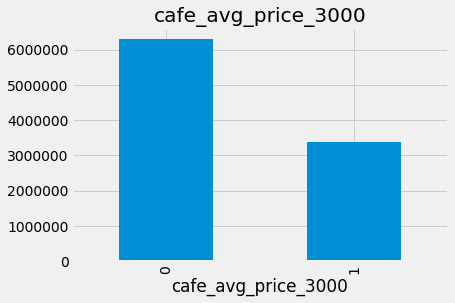

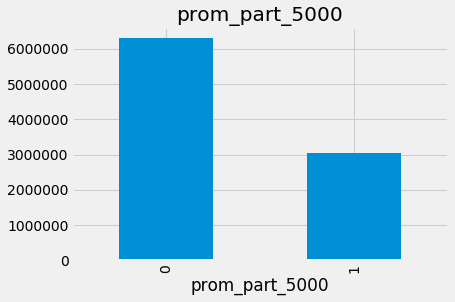

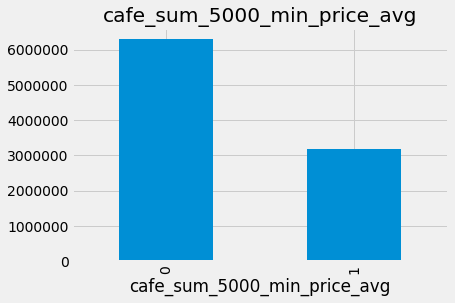

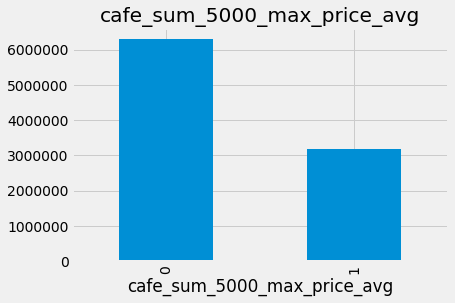

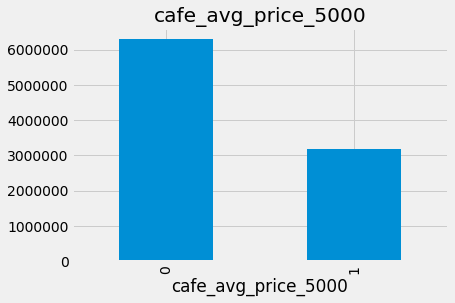

In [9]:
for feature in features_with_na:
    data = train_data.copy()

    data[feature] = np.where(data[feature].isnull(), 1, 0)
    
    
    data.groupby(feature)['price_doc'].median().plot.bar()
    plt.title(feature)
    plt.show()

# 3.NUMERICAL VARIABLES
### * We are having different types of numerical variables
### a.Numerical Continous Variables
### b.Numerical Discrete Variables
### c.Date variables

In [10]:
numerical_features = [feature for feature in train_data.columns if train_data[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))


train_data[numerical_features].head()

Number of numerical variables:  276


,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25_raion,shopping_centers_raion,office_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road2_km,ID_big_road2,railroad_km,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_count_2000_price_1500,cafe_count_2000_price_2500,cafe_count_2000_price_4000,cafe_count_2000_price_high,big_church_count_2000,church_count_2000,mosque_count_2000,leisure_c

## C. Date variables Present or not 

In [11]:
year_feature = [feature for feature in numerical_features if 'Yr' in feature or 'Year' in feature or "date" in feature]

year_feature

['raion_build_count_with_builddate_info']

In [12]:
train_data["raion_build_count_with_builddate_info"]

0        211.0
1        244.0
2        330.0
3        459.0
4        746.0
         ...  
30466    282.0
30467    650.0
30468      NaN
30469    186.0
30470    303.0
Name: raion_build_count_with_builddate_info, Length: 30471, dtype: float64

# B. Numerical Discrete Variables

In [13]:
discrete_feature=[feature for feature in numerical_features if len(train_data[feature].unique())<25 and feature not in year_feature+['id']]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 46


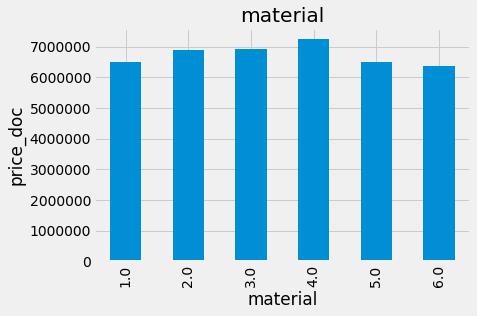

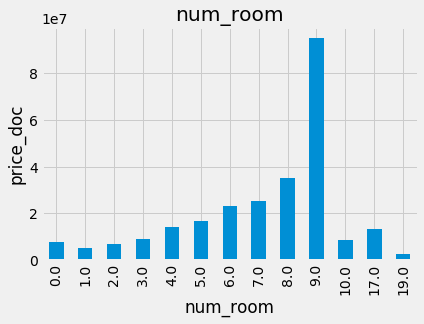

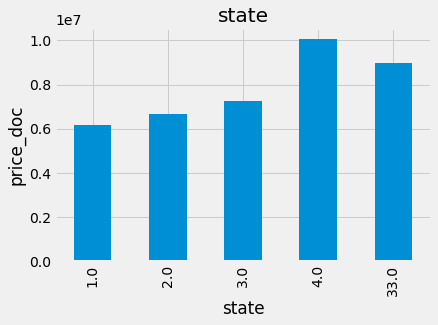

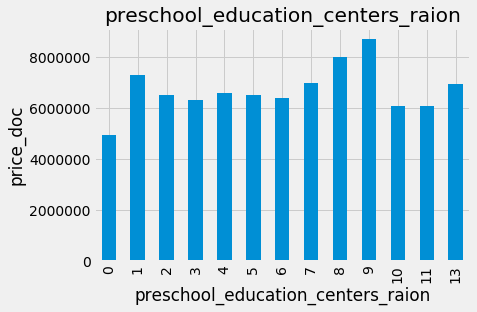

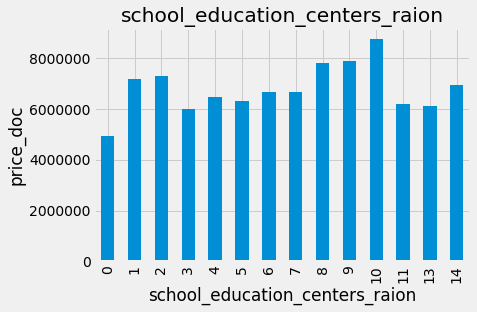

...

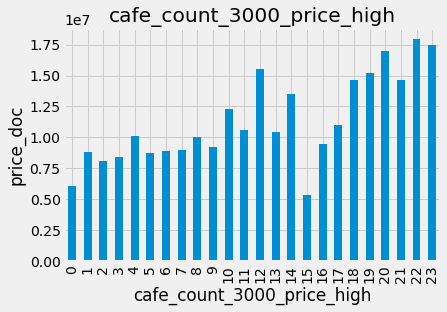

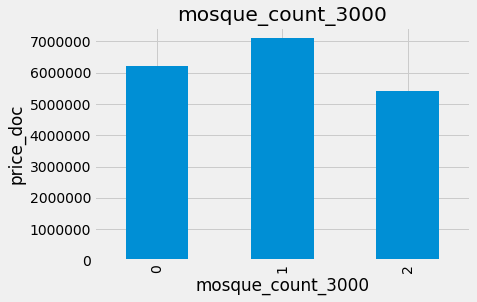

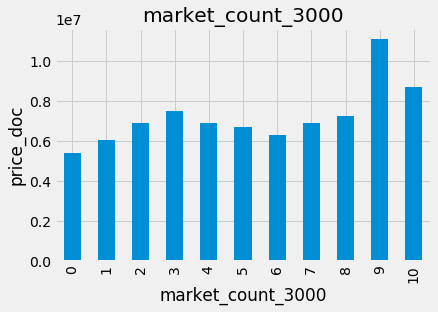

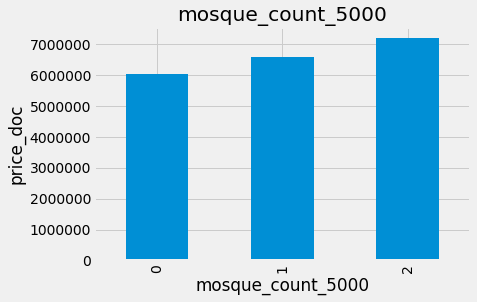

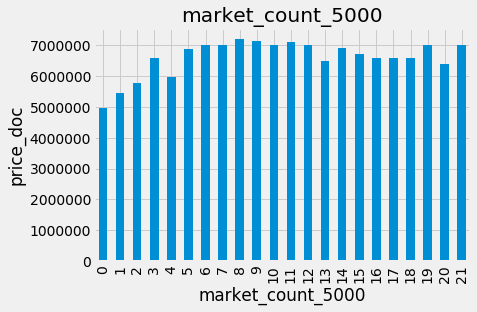

In [14]:
for feature in discrete_feature:
    data=train_data.copy()
    data.groupby(feature)['price_doc'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('price_doc')
    plt.title(feature)
    plt.show()

# A. Numerical Continous Variables

In [15]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature+year_feature+['id']]
print("Continuous feature Count {}".format(len(continuous_feature)))

Continuous feature Count 228


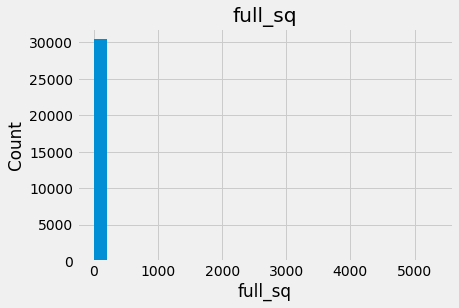

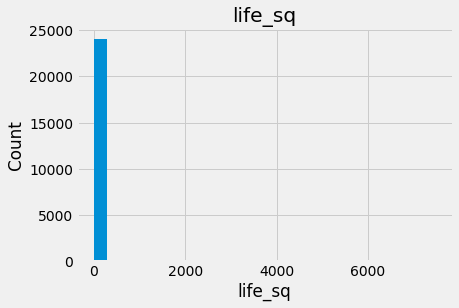

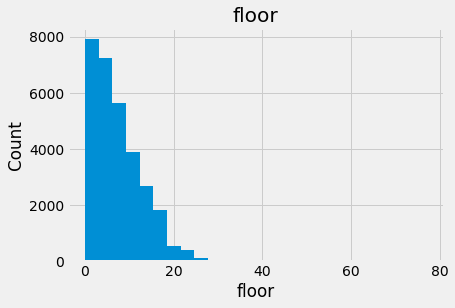

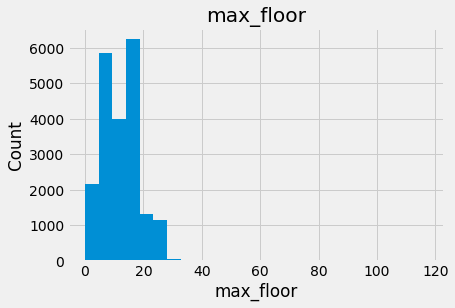

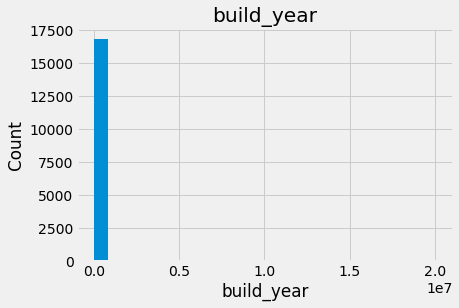

...

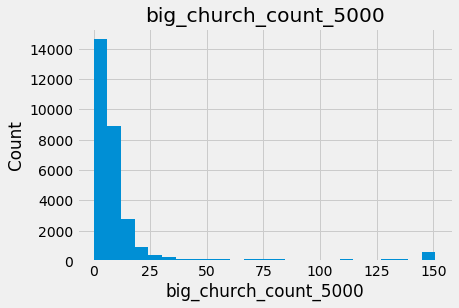

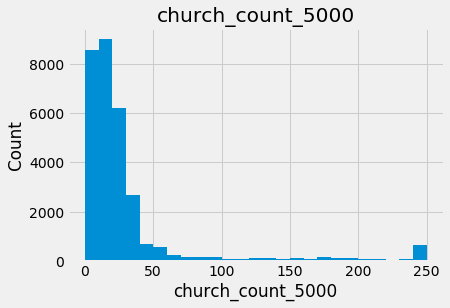

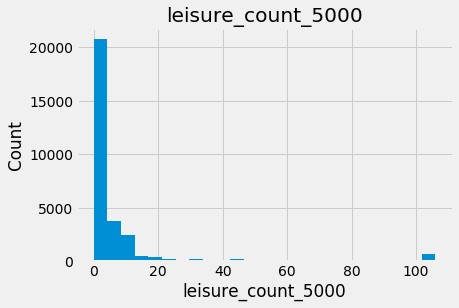

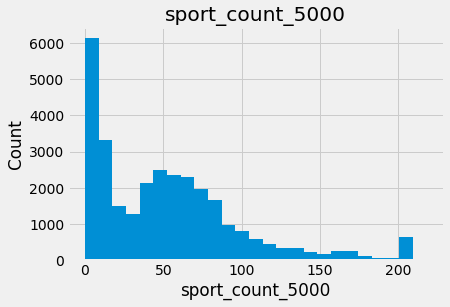

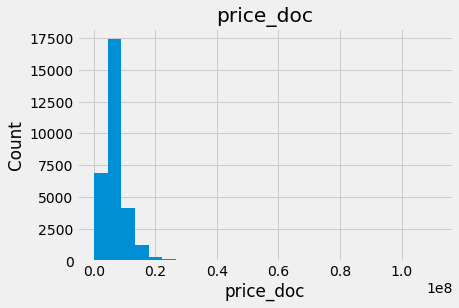

In [16]:
for feature in continuous_feature:
    data=train_data.copy()
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

## Applying Log

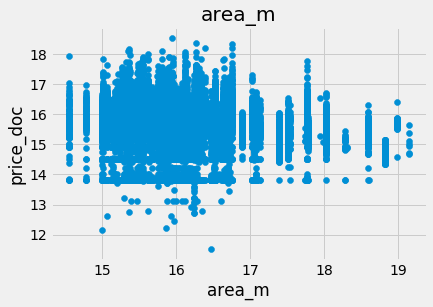

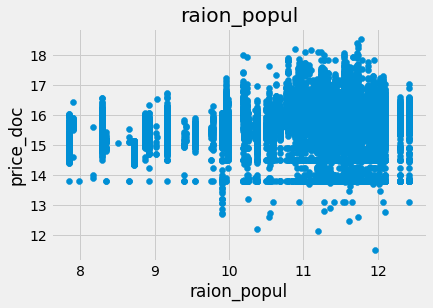

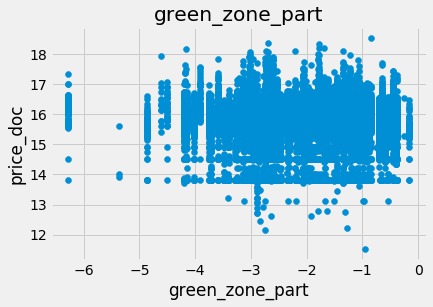

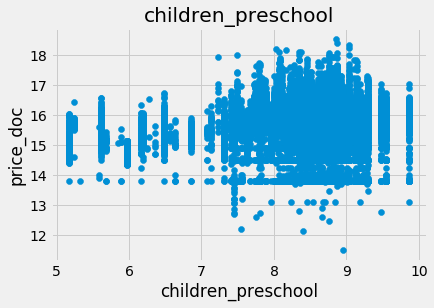

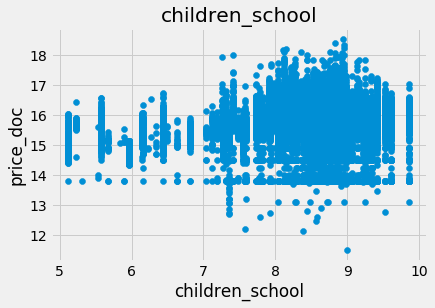

...

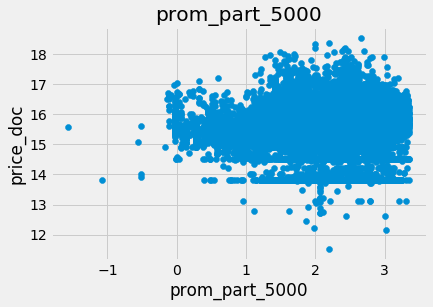

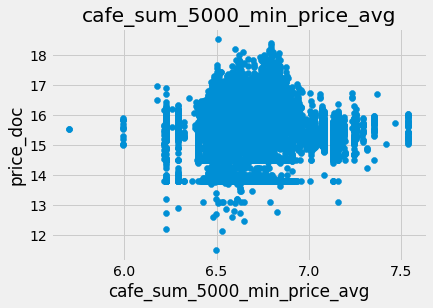

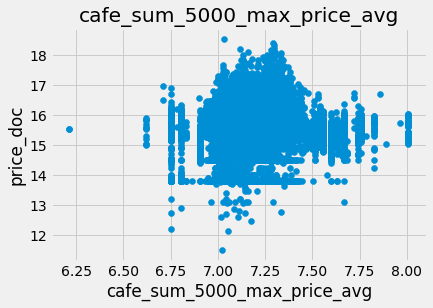

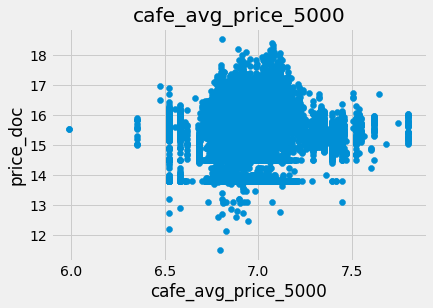

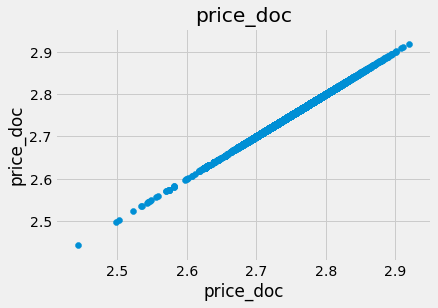

In [17]:
for feature in continuous_feature:
    data=train_data.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data['price_doc']=np.log(data['price_doc'])
        plt.scatter(data[feature],data['price_doc'])
        plt.xlabel(feature)
        plt.ylabel('price_doc')
        plt.title(feature)
        plt.show()

## Finding Outliers

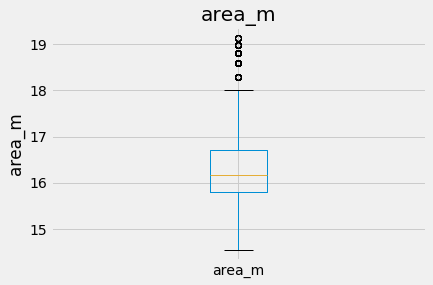

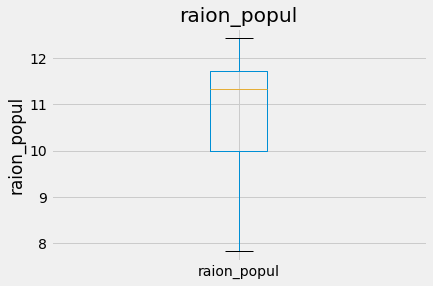

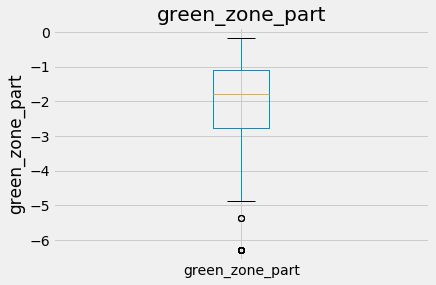

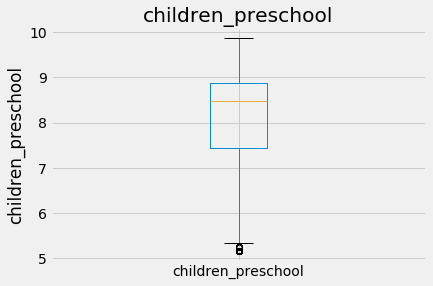

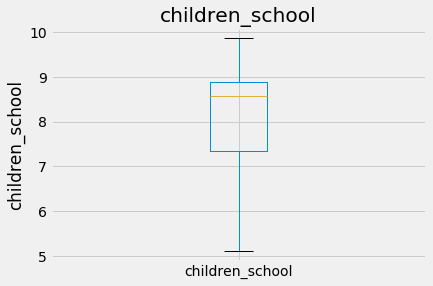

...

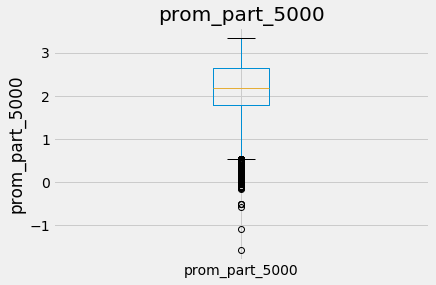

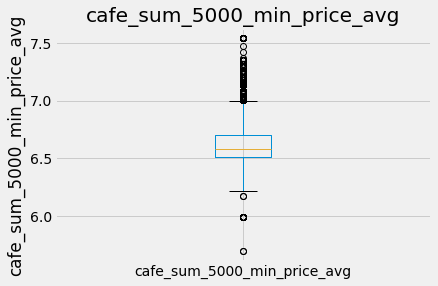

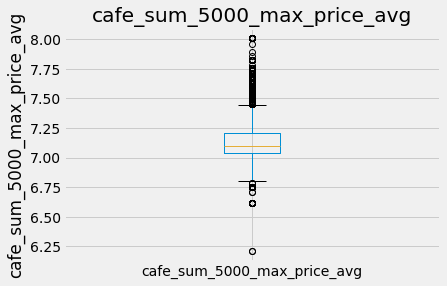

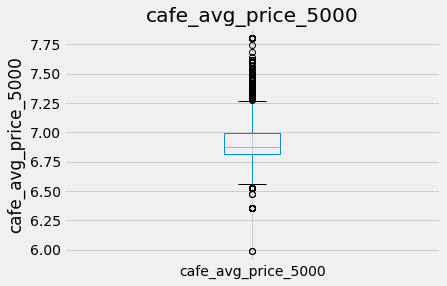

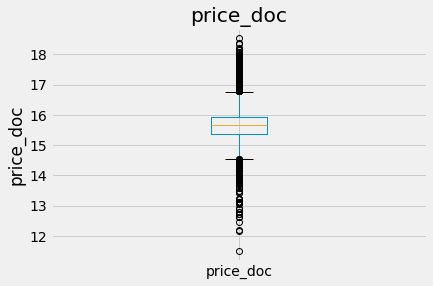

In [18]:
for feature in continuous_feature:
    data=train_data.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.show()

# CATEGORICAL VARIABLES

In [19]:
categorical_features=[feature for feature in train_data.columns if train_data[feature].dtypes=='O']
len(categorical_features)

16

In [20]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(train_data[feature].unique())))

The feature is timestamp and number of categories are 1161
The feature is product_type and number of categories are 2
The feature is sub_area and number of categories are 146
The feature is culture_objects_top_25 and number of categories are 2
The feature is thermal_power_plant_raion and number of categories are 2
The feature is incineration_raion and number of categories are 2
The feature is oil_chemistry_raion and number of categories are 2
The feature is radiation_raion and number of categories are 2
The feature is railroad_terminal_raion and number of categories are 2
The feature is big_market_raion and number of categories are 2
The feature is nuclear_reactor_raion and number of categories are 2
The feature is detention_facility_raion and number of categories are 2
The feature is water_1line and number of categories are 2
The feature is big_road1_1line and number of categories are 2
The feature is railroad_1line and number of categories are 2
The feature is ecology and number of c

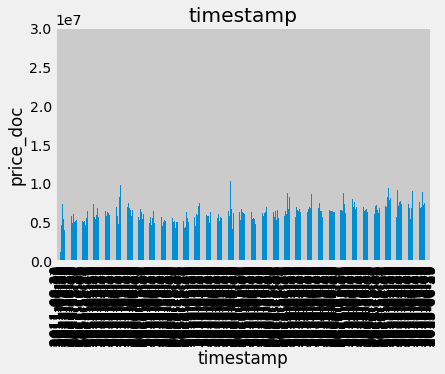

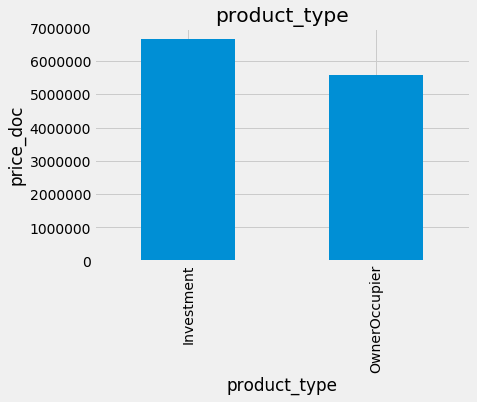

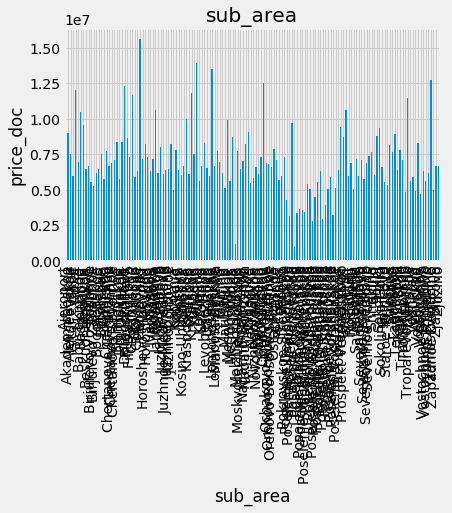

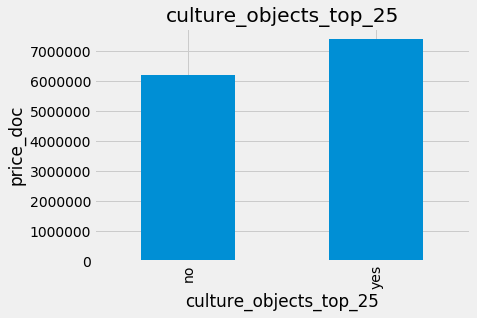

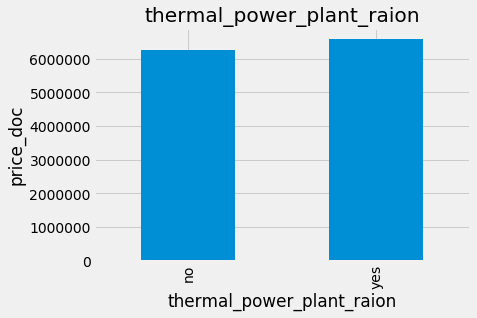

...

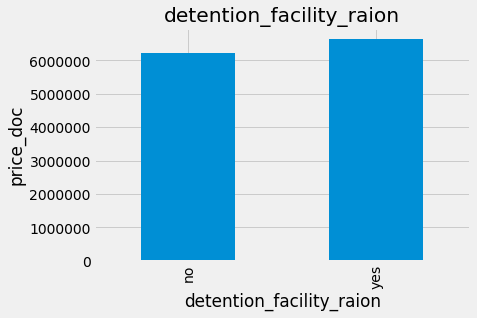

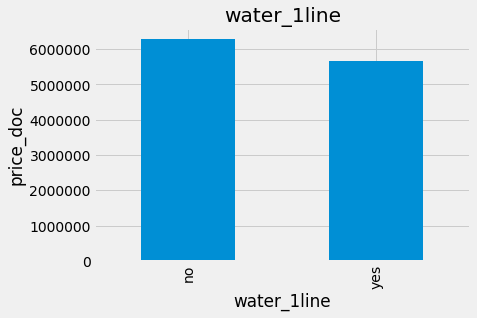

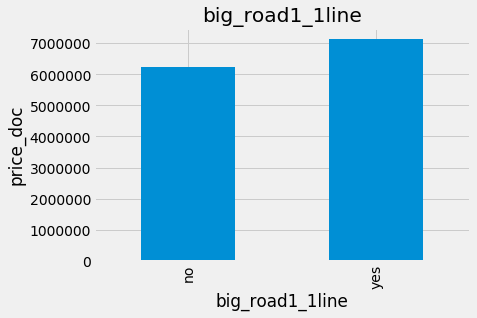

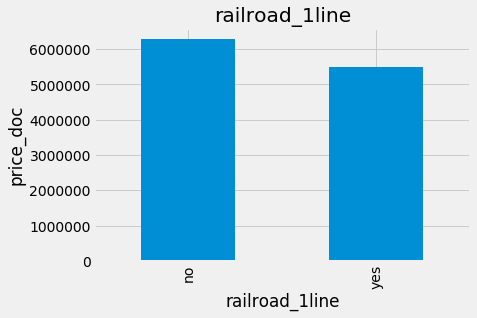

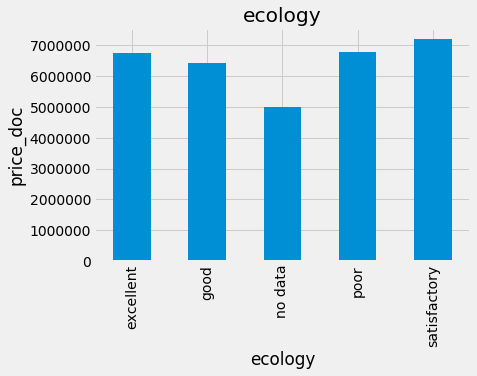

In [21]:
for feature in categorical_features:
    data=train_data.copy()
    data.groupby(feature)['price_doc'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('price_doc')
    plt.title(feature)
    plt.show()

# FEATURE ENGINEERING

In [22]:
train_data["timestamp"]

0        2011-08-20
1        2011-08-23
2        2011-08-27
3        2011-09-01
4        2011-09-05
            ...    
30466    2015-06-30
30467    2015-06-30
30468    2015-06-30
30469    2015-06-30
30470    2015-06-30
Name: timestamp, Length: 30471, dtype: object

In [23]:
train_data['date']=pd.to_datetime(train_data.timestamp)

In [24]:
train_data.drop("timestamp",axis=1,inplace=True)

In [25]:
train_data['year']=train_data.date.dt.year

In [26]:
train_data['month']=train_data.date.dt.month

In [27]:
train_data['day']=train_data.date.dt.day

In [28]:
train_data.drop("date",axis=1,inplace=True)

In [29]:
train_data.dtypes

id                                         int64
full_sq                                    int64
life_sq                                  float64
floor                                    float64
max_floor                                float64
material                                 float64
build_year                               float64
num_room                                 float64
kitch_sq                                 float64
state                                    float64
product_type                              object
sub_area                                  object
area_m                                   float64
raion_popul                                int64
green_zone_part                          float64
indust_part                              float64
children_preschool                         int64
preschool_quota                          float64
preschool_education_centers_raion          int64
children_school                            int64
school_quota        

In [30]:
test_data=pd.read_csv("test_data.csv")

In [31]:
test_data["timestamp"][0]

'2015-07-01'

In [32]:
test_data['date']=pd.to_datetime(test_data.timestamp)

In [33]:
test_data.drop("timestamp",axis=1,inplace=True)

In [34]:
test_data['year']=test_data.date.dt.year

In [35]:
test_data['month']=test_data.date.dt.month

In [36]:
test_data['day']=test_data.date.dt.day

In [37]:
test_data.drop("date",axis=1,inplace=True)

In [38]:
test_data.dtypes

id                                         int64
full_sq                                  float64
life_sq                                  float64
floor                                      int64
max_floor                                  int64
material                                   int64
build_year                               float64
num_room                                   int64
kitch_sq                                 float64
state                                    float64
product_type                              object
sub_area                                  object
area_m                                   float64
raion_popul                                int64
green_zone_part                          float64
indust_part                              float64
children_preschool                         int64
preschool_quota                          float64
preschool_education_centers_raion          int64
children_school                            int64
school_quota        

In [39]:
train_data.shape

(30471, 294)

In [40]:
test_data.shape

(7662, 293)

## Handling Categorical NA values

In [41]:
features_nan=[feature for feature in train_data.columns if train_data[feature].isnull().sum()>1 and train_data[feature].dtypes=='O']

for feature in features_nan:
    print("{}: {}% missing values".format(feature,np.round(train_data[feature].isnull().mean(),4)))

In [42]:
features_nan

[]

## Handling Numerical NA values

In [43]:

numerical_with_nan=[feature for feature in train_data.columns if train_data[feature].isnull().sum()>1 and train_data[feature].dtypes!='O']

for feature in numerical_with_nan:
    print("{}: {}% missing value".format(feature,np.around(train_data[feature].isnull().mean(),4)))

life_sq: 0.2095% missing value
floor: 0.0055% missing value
max_floor: 0.3141% missing value
material: 0.3141% missing value
build_year: 0.4465% missing value
num_room: 0.3141% missing value
kitch_sq: 0.3141% missing value
state: 0.445% missing value
preschool_quota: 0.2195% missing value
school_quota: 0.2194% missing value
hospital_beds_raion: 0.4739% missing value
raion_build_count_with_material_info: 0.1638% missing value
build_count_block: 0.1638% missing value
build_count_wood: 0.1638% missing value
build_count_frame: 0.1638% missing value
build_count_brick: 0.1638% missing value
build_count_monolith: 0.1638% missing value
build_count_panel: 0.1638% missing value
build_count_foam: 0.1638% missing value
build_count_slag: 0.1638% missing value
build_count_mix: 0.1638% missing value
raion_build_count_with_builddate_info: 0.1638% missing value
build_count_before_1920: 0.1638% missing value
build_count_1921-1945: 0.1638% missing value
build_count_1946-1970: 0.1638% missing value
build_

In [44]:
for feature in numerical_with_nan:
    ## We will replace by using median since there are outliers
    median_value=train_data[feature].median()
    
    ## create a new feature to capture nan values
    train_data[feature+'nan']=np.where(train_data[feature].isnull(),1,0)
    train_data[feature].fillna(median_value,inplace=True)
    
train_data[numerical_with_nan].isnull().sum()

life_sq                                  0
floor                                    0
max_floor                                0
material                                 0
build_year                               0
num_room                                 0
kitch_sq                                 0
state                                    0
preschool_quota                          0
school_quota                             0
hospital_beds_raion                      0
raion_build_count_with_material_info     0
build_count_block                        0
build_count_wood                         0
build_count_frame                        0
build_count_brick                        0
build_count_monolith                     0
build_count_panel                        0
build_count_foam                         0
build_count_slag                         0
build_count_mix                          0
raion_build_count_with_builddate_info    0
build_count_before_1920                  0
build_count

In [45]:
train_data.dtypes

id                                  int64
full_sq                             int64
life_sq                           float64
floor                             float64
max_floor                         float64
                                   ...   
cafe_avg_price_3000nan              int32
prom_part_5000nan                   int32
cafe_sum_5000_min_price_avgnan      int32
cafe_sum_5000_max_price_avgnan      int32
cafe_avg_price_5000nan              int32
Length: 345, dtype: object

In [46]:
features_nan_test=[feature for feature in test_data.columns if test_data[feature].isnull().sum()>1 and test_data[feature].dtypes=='O']

for feature in features_nan_test:
    print("{}: {}% missing values".format(feature,np.round(test_data[feature].isnull().mean(),4)))

product_type: 0.0043% missing values


In [47]:
def replace_cat_feature_test(test_data,features_nan_test):
    data=test_data.copy()
    data[features_nan_test]=data[features_nan_test].fillna('Missing')
    return data

test_data=replace_cat_feature_test(test_data,features_nan_test)

test_data[features_nan_test].isnull().sum()

product_type    0
dtype: int64

In [48]:

numerical_with_nan_test=[feature for feature in test_data.columns if test_data[feature].isnull().sum()>1 and test_data[feature].dtypes!='O']

for feature in numerical_with_nan_test:
    print("{}: {}% missing value".format(feature,np.around(test_data[feature].isnull().mean(),4)))

life_sq: 0.1535% missing value
build_year: 0.1369% missing value
state: 0.0906% missing value
preschool_quota: 0.2083% missing value
school_quota: 0.2082% missing value
hospital_beds_raion: 0.4461% missing value
raion_build_count_with_material_info: 0.159% missing value
build_count_block: 0.159% missing value
build_count_wood: 0.159% missing value
build_count_frame: 0.159% missing value
build_count_brick: 0.159% missing value
build_count_monolith: 0.159% missing value
build_count_panel: 0.159% missing value
build_count_foam: 0.159% missing value
build_count_slag: 0.159% missing value
build_count_mix: 0.159% missing value
raion_build_count_with_builddate_info: 0.159% missing value
build_count_before_1920: 0.159% missing value
build_count_1921-1945: 0.159% missing value
build_count_1946-1970: 0.159% missing value
build_count_1971-1995: 0.159% missing value
build_count_after_1995: 0.159% missing value
metro_min_walk: 0.0044% missing value
metro_km_walk: 0.0044% missing value
railroad_stat

In [49]:
for feature in numerical_with_nan_test:
    ## We will replace by using median since there are outliers
    median_value=test_data[feature].median()
    
    ## create a new feature to capture nan values
    test_data[feature+'nan']=np.where(test_data[feature].isnull(),1,0)
    test_data[feature].fillna(median_value,inplace=True)
    
test_data[numerical_with_nan_test].isnull().sum()

life_sq                                  0
build_year                               0
state                                    0
preschool_quota                          0
school_quota                             0
hospital_beds_raion                      0
raion_build_count_with_material_info     0
build_count_block                        0
build_count_wood                         0
build_count_frame                        0
build_count_brick                        0
build_count_monolith                     0
build_count_panel                        0
build_count_foam                         0
build_count_slag                         0
build_count_mix                          0
raion_build_count_with_builddate_info    0
build_count_before_1920                  0
build_count_1921-1945                    0
build_count_1946-1970                    0
build_count_1971-1995                    0
build_count_after_1995                   0
metro_min_walk                           0
metro_km_wa

In [50]:
test_data.shape

(7662, 340)

In [51]:
train_data.shape

(30471, 345)

In [52]:
numerical_features_test= [feature for feature in test_data.columns if test_data[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features_test))

test_data[numerical_features_test].head()

Number of numerical variables:  325


,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25_raion,shopping_centers_raion,office_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road2_km,ID_big_road2,railroad_km,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,...,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_count_2000_price_1500,cafe_count_2000_price_2500,cafe_count_2000_price_4000,cafe_count_2000_price_high,big_church_count_2000,church_count_2000,mosque_count_2000,leisure_count_2000,sport_count_2000,market_count_2000,green_part_3000,prom_part_3000,office_count_3000,office_sqm_3000,trc_count_3000,trc_sqm_3000,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_

In [53]:
year_feature_test= [feature for feature in numerical_features if 'Yr' in feature or 'Year' in feature]

year_feature_test

[]

In [54]:
discrete_feature_test=[feature for feature in numerical_features_test if len(test_data[feature].unique())<25 and feature not in year_feature_test+['id']]
print("Discrete Variables Count: {}".format(len(discrete_feature_test)))

Discrete Variables Count: 101


In [55]:
continuous_feature_test=[feature for feature in numerical_features_test if feature not in discrete_feature_test+year_feature_test+['Id']]
print("Continuous feature Count {}".format(len(continuous_feature_test)))

Continuous feature Count 224


In [56]:
categorical_features_test=[feature for feature in test_data.columns if test_data[feature].dtypes=='O']
len(categorical_features_test)

15

In [57]:
for feature in categorical_features_test:
    print('The feature is {} and number of categories are {}'.format(feature,len(test_data[feature].unique())))

The feature is product_type and number of categories are 3
The feature is sub_area and number of categories are 145
The feature is culture_objects_top_25 and number of categories are 2
The feature is thermal_power_plant_raion and number of categories are 2
The feature is incineration_raion and number of categories are 2
The feature is oil_chemistry_raion and number of categories are 2
The feature is radiation_raion and number of categories are 2
The feature is railroad_terminal_raion and number of categories are 2
The feature is big_market_raion and number of categories are 2
The feature is nuclear_reactor_raion and number of categories are 2
The feature is detention_facility_raion and number of categories are 2
The feature is water_1line and number of categories are 2
The feature is big_road1_1line and number of categories are 2
The feature is railroad_1line and number of categories are 2
The feature is ecology and number of categories are 5


# RARE VARIABLE

In [58]:
for feature in categorical_features_test:
    test_data[feature] = test_data[feature].map((train_data.groupby(feature)['price_doc'].count()/len(train_data)).to_dict())
    #train_data[feature] = train_data[feature].map((train_data.groupby(feature)['SalePrice'].count()/len(train_data)).to_dict())

In [59]:
categorical_features=[feature for feature in train_data.columns if train_data[feature].dtypes=='O' if feature not in ["timestamp"]]
len(categorical_features)

15

In [60]:
for feature in categorical_features:
    temp=train_data.groupby(feature)['price_doc'].count()/len(train_data)
    temp_df=temp[temp>0.01].index
    train_data[feature]=np.where(train_data[feature].isin(temp_df),train_data[feature],'Rare_var')

In [61]:
for feature in categorical_features_test:
    temp=test_data[feature]
    temp_df=temp[temp>0.01].index
    test_data[feature]=np.where(test_data[feature].isin(temp_df),test_data[feature],'Rare_var')

# TARGET ENCODING

In [62]:
for feature in categorical_features:
    labels_ordered=train_data.groupby([feature])['price_doc'].mean().sort_values().index
    labels_ordered={k:i for i,k in enumerate(labels_ordered,0)}
    train_data[feature]=train_data[feature].map(labels_ordered)

In [63]:
for feature in categorical_features_test:
    labels_ordered=test_data[feature]
    labels_ordered={k:i for i,k in enumerate(labels_ordered,0)}
    test_data[feature]=test_data[feature].map(labels_ordered)

In [64]:
train_data.head()

,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,...,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_count_2000_price_1500,cafe_count_2000_price_2500,cafe_count_2000_price_4000,cafe_count_2000_price_high,big_church_count_2000,church_count_2000,mosque_count_2000,leisure_count_2000,sport_count_2000,market_count_2000,green_part_3000,prom_part_3000,office_count_3000,office_sqm_3000,trc_count_3000,trc_sqm_3000,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,caf

In [65]:
test_data.head()

,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,...,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_count_2000_price_1500,cafe_count_2000_price_2500,cafe_count_2000_price_4000,cafe_count_2000_price_high,big_church_count_2000,church_count_2000,mosque_count_2000,leisure_count_2000,sport_count_2000,market_count_2000,green_part_3000,prom_part_3000,office_count_3000,office_sqm_3000,trc_count_3000,trc_sqm_3000,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,

## Performing log normal distribution on numerical continous variables

In [66]:
continuous_feature

['full_sq',
 'life_sq',
 'floor',
 'max_floor',
 'build_year',
 'kitch_sq',
 'area_m',
 'raion_popul',
 'green_zone_part',
 'indust_part',
 'children_preschool',
 'preschool_quota',
 'children_school',
 'school_quota',
 'hospital_beds_raion',
 'office_raion',
 'full_all',
 'male_f',
 'female_f',
 'young_all',
 'young_male',
 'young_female',
 'work_all',
 'work_male',
 'work_female',
 'ekder_all',
 'ekder_male',
 'ekder_female',
 '0_6_all',
 '0_6_male',
 '0_6_female',
 '7_14_all',
 '7_14_male',
 '7_14_female',
 '0_17_all',
 '0_17_male',
 '0_17_female',
 '16_29_all',
 '16_29_male',
 '16_29_female',
 '0_13_all',
 '0_13_male',
 '0_13_female',
 'raion_build_count_with_material_info',
 'build_count_block',
 'build_count_wood',
 'build_count_brick',
 'build_count_monolith',
 'build_count_panel',
 'build_count_before_1920',
 'build_count_1921-1945',
 'build_count_1946-1970',
 'build_count_1971-1995',
 'build_count_after_1995',
 'ID_metro',
 'metro_min_avto',
 'metro_km_avto',
 'metro_min_walk'

In [67]:
import numpy as np
num_features=continuous_feature

for feature in num_features:
    train_data[feature]=np.log(train_data[feature])

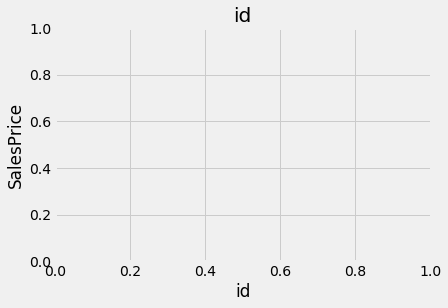

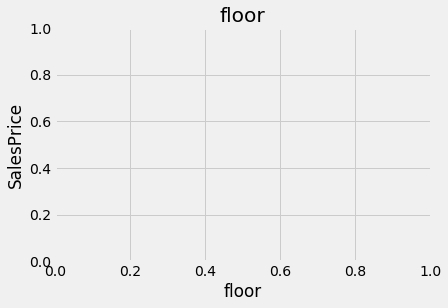

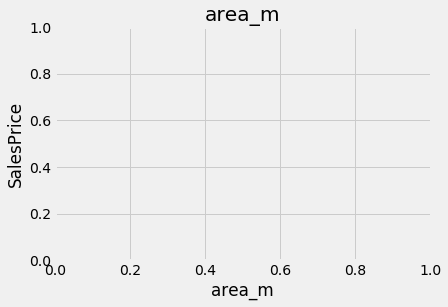

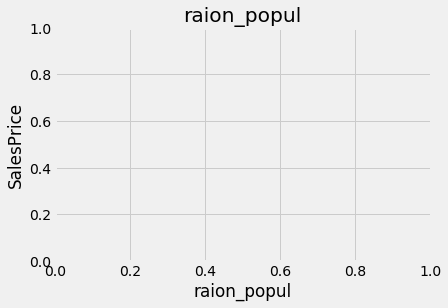

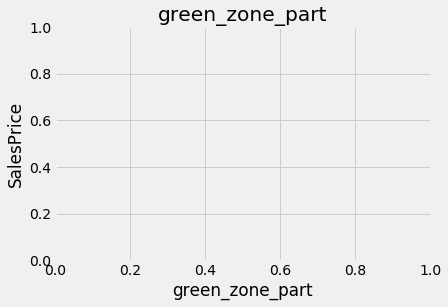

...

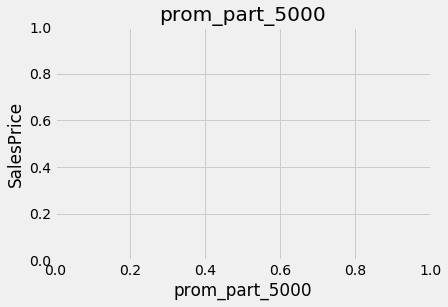

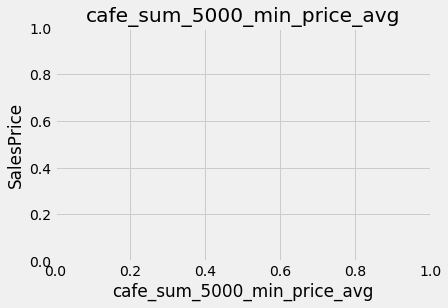

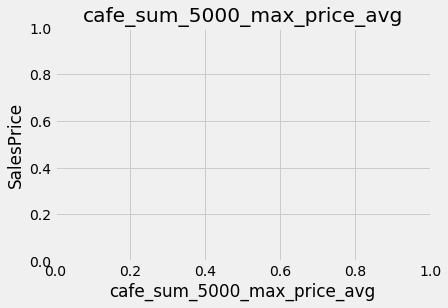

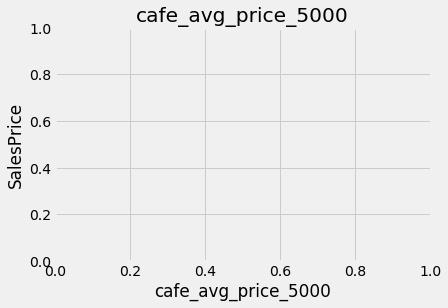

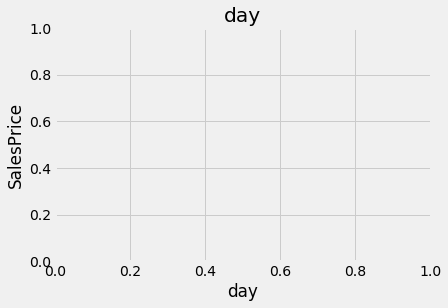

In [68]:
for feature in continuous_feature_test:
    data=test_data.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        #data['SalePrice']=np.log(data['SalePrice'])
        #plt.scatter(data[feature],data['SalePrice'])
        plt.xlabel(feature)
        plt.ylabel('SalesPrice')
        plt.title(feature)
        plt.show()

In [69]:
import numpy as np
num_features=continuous_feature_test

for feature in num_features:
    train_data[feature]=np.log(train_data[feature])

In [70]:
train_data.head()

,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,...,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_count_2000_price_1500,cafe_count_2000_price_2500,cafe_count_2000_price_4000,cafe_count_2000_price_high,big_church_count_2000,church_count_2000,mosque_count_2000,leisure_count_2000,sport_count_2000,market_count_2000,green_part_3000,prom_part_3000,office_count_3000,office_sqm_3000,trc_count_3000,trc_sqm_3000,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,green_part_5000,prom_part_5000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,cafe_count_5000,caf

# FEATURE SCALING

In [71]:
scaling_feature=[feature for feature in train_data.columns if feature not in ['id','Price_doc'] ]
len(scaling_feature)

344

In [72]:
train_data.fillna(0,inplace=True)

In [73]:
[min(train_data[i]) for i in train_data.columns]

[0.0,
 -inf,
 -inf,
 -inf,
 -inf,
 1.0,
 -inf,
 0.0,
 -inf,
 1.0,
 0,
 0,
 2.6774989428536276,
 2.0595294527304104,
 0.0,
 0.0,
 1.641863663944111,
 0.0,
 0,
 1.633928354228994,
 1.9343700821476857,
 0,
 0,
 0.0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 -inf,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2.0595294527304104,
 1.9596328997183297,
 1.974243635478386,
 1.7749349530624492,
 1.6566548425881231,
 1.6440614850208792,
 2.0012332255705867,
 1.9110842330081819,
 1.894269181238364,
 1.8415452149350158,
 1.61935972946482,
 1.7873848498299765,
 1.641863663944111,
 1.50648771329857,
 1.4912513280732116,
 1.633928354228994,
 1.4964725796851872,
 1.4831304777411851,
 1.7948535467124367,
 1.6800782821876006,
 1.6654905987582682,
 1.8491427716078928,
 1.7457329447065377,
 1.710800555208106,
 1.7534605989414096,
 1.631588328253238,
 1.61935972946482,
 -inf,
 -inf,
 -inf,
 0.0,
 -inf,
 -inf,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -inf,
 -inf,
 -inf,
 -inf,
 -inf,
 -inf,
 -7.960598786346565,
 -9.839206968048753,
 -5.756901

In [74]:
for i in train_data.columns:
    train_data.loc[(train_data[i]==min(train_data[i])),i]=np.quantile(train_data[i],1)

In [75]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
train_data.loc[:,scaling_feature] = scaler.fit_transform(train_data.loc[:,scaling_feature])

In [76]:
scaling_feature_test=[feature for feature in test_data.columns if feature not in ['id'] ]
len(scaling_feature_test)

339

In [77]:
for i in test_data.columns:
    test_data.loc[(test_data[i]==min(test_data[i])),i]=np.quantile(test_data[i],1)

In [78]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
test_data.loc[:,scaling_feature_test] = scaler.fit_transform(test_data.loc[:,scaling_feature_test])

In [79]:
test_data.head()

,id,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,...,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_count_2000_price_1500,cafe_count_2000_price_2500,cafe_count_2000_price_4000,cafe_count_2000_price_high,big_church_count_2000,church_count_2000,mosque_count_2000,leisure_count_2000,sport_count_2000,market_count_2000,green_part_3000,prom_part_3000,office_count_3000,office_sqm_3000,trc_count_3000,trc_sqm_3000,cafe_count_3000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,cafe_count_3000_na_price,cafe_count_3000_price_500,cafe_count_3000_price_1000,cafe_count_3000_price_1500,cafe_count_3000_price_2500,cafe_count_3000_price_4000,cafe_count_3000_price_high,big_church_count_3000,church_count_3000,mosque_count_3000,leisure_count_3000,sport_count_3000,market_count_3000,

# FEATURE SELECTION

In [80]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [81]:
train_data.drop("id",axis=1,inplace=True)

In [82]:
train_data_new=train_data.drop(['price_doc'],axis=1)

In [83]:
y_train=train_data[['price_doc']]

In [84]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.005, random_state=123)) # remember to set the seed, the random state in this function
feature_sel_model.fit(train_data_new, y_train)

SelectFromModel(estimator=Lasso(alpha=0.005, copy_X=True, fit_intercept=True,
                                max_iter=1000, normalize=False, positive=False,
                                precompute=False, random_state=123,
                                selection='cyclic', tol=0.0001,
                                warm_start=False),
                max_features=None, norm_order=1, prefit=False, threshold=None)

In [85]:
selected_feat = train_data_new.columns[(feature_sel_model.get_support())]

# let's print some stats
print('total features: {}'.format((train_data_new.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(np.sum(feature_sel_model.estimator_.coef_ == 0)))

total features: 343
selected features: 120
features with coefficients shrank to zero: 223


In [86]:
selected_feat

Index(['full_sq', 'life_sq', 'max_floor', 'material', 'build_year', 'num_room',
       'kitch_sq', 'state', 'sub_area', 'preschool_quota',
       ...
       'cafe_sum_5000_max_price_avg', 'cafe_count_5000_price_500',
       'cafe_count_5000_price_1000', 'cafe_count_5000_price_1500',
       'cafe_count_5000_price_2500', 'cafe_count_5000_price_4000',
       'cafe_count_5000_price_high', 'leisure_count_5000', 'sport_count_5000',
       'year'],
      dtype='object', length=120)

In [87]:
train_data_new=train_data_new[selected_feat]

In [88]:
test_data.to_csv("test123.csv")

In [89]:
test_data_new=pd.read_csv("test123.csv",usecols=selected_feat)

In [90]:
test_data_new.shape

(7662, 120)

In [91]:
train_data_new.shape

(30471, 120)

In [92]:
from sklearn.model_selection import train_test_split

In [93]:
xtrain,xtest,ytrain,ytest=train_test_split(train_data_new,y_train,test_size=0.3,random_state=123)

In [94]:
xtrain.shape,xtest.shape,ytrain.shape,ytest.shape

((21329, 120), (9142, 120), (21329, 1), (9142, 1))

In [95]:
ytrain=np.array(ytrain)
ytest = np.array(ytest)

In [96]:
def model_builder(model):
    m = model
    m.fit(xtrain,ytrain) # log(y) follows normal distribution
    train_pred =np.exp(m.predict(xtrain))
    test_pred = np.exp(m.predict(xtest))
    print('========Train=======')
    print('RMSE :' ,np.sqrt(mean_squared_error(ytrain,train_pred)))
    print('MAPE :' , np.mean(np.abs((ytrain-train_pred)/ytrain))*100)
    print('========Test=======')
    print('RMSE :' ,np.sqrt(mean_squared_error(ytest,test_pred)))
    print('MAPE :' , np.mean(np.abs((ytest-test_pred)/ytest))*100)
    return m

In [97]:
train_data_new.fillna(0,inplace=True)

In [98]:
np.where(train_data_new.values >= np.finfo(np.float64).max)

(array([], dtype=int64), array([], dtype=int64))

In [99]:
lr=model_builder(LinearRegression())

========Train=======
RMSE : 1.9566156934714765
MAPE : 1173.0115037051728
========Test=======
RMSE : 2.168163042526417
MAPE : 892.5329576393402


In [100]:
xg = model_builder(XGBRegressor())

========Train=======
RMSE : 2.4013148581991
MAPE : 1673.4218221945025
========Test=======
RMSE : 2.185605323077104
MAPE : 1338.9667586534404


In [104]:
xg = model_builder(XGBRegressor())

========Train=======
RMSE : 2.4013148581991
MAPE : 1673.4218221945025
========Test=======
RMSE : 2.185605323077104
MAPE : 1338.9667586534404


In [105]:
params ={'max_depth':range(1,15), 'min_samples_split':range(10,70,10)}
 
dt = model_builder(GridSearchCV(DecisionTreeRegressor( ) , param_grid=params , cv=2 , n_jobs=-1))

========Train=======
RMSE : 1.7590339520454807
MAPE : 1473.3109878439675
========Test=======
RMSE : 1.8057512588993503
MAPE : 1238.9236506498446


In [106]:
params = {'n_estimators':range(50,200,50),'learning_rate':[0.5,0.7,1.0]}
ad = model_builder(GridSearchCV(AdaBoostRegressor() , param_grid=params , cv=2 ,n_jobs=-1))

========Train=======
RMSE : 1.0519314655659922
MAPE : 645.4961496920954
========Test=======
RMSE : 1.081722131068907
MAPE : 544.9429240394156


In [107]:
gb = model_builder(GradientBoostingRegressor(n_estimators=50 , learning_rate=0.1))

========Train=======
RMSE : 1.602944277401274
MAPE : 1432.9728593461186
========Test=======
RMSE : 1.626682221055294
MAPE : 1198.0175654116974


In [108]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

In [109]:
clf=model_builder(Ridge())

========Train=======
RMSE : 1.9563973670194497
MAPE : 1172.9959597401967
========Test=======
RMSE : 2.167822260676223
MAPE : 892.5289066706323


In [110]:
clf2=model_builder(Lasso())

========Train=======
RMSE : 1.4105768207813816
MAPE : 1169.3184292169735
========Test=======
RMSE : 1.43518690681185
MAPE : 983.7045381218818


In [111]:
rf123=model_builder(RandomForestRegressor())

========Train=======
RMSE : 2.1293767687410385
MAPE : 1672.4426218161948
========Test=======
RMSE : 1.845423825621202
MAPE : 1265.5462614173314


In [112]:
sub=pd.read_csv("sample_submission.csv/sample_submission.csv")

In [116]:
sub.head()

,id,price_doc
0,30474,0.383503
1,30475,1.256324
2,30476,0.514588
3,30477,0.596932
4,30478,0.491853


In [113]:
test_prediction = np.exp(rf123.predict(test_data_new))

In [114]:
sub['price_doc']=test_prediction

In [115]:
sub.to_csv('final_submission_rf34.csv',index=False)